# single cell RNA-seq のQCとReference Component Analysisによるcluster解析

In [296]:
library(ggpubr)
library(gplots)
library(monocle)

ERROR: Error: package or namespace load failed for ‘ggpubr’ in loadNamespace(j <- i[[1L]], c(lib.loc, .libPaths()), versionCheck = vI[[j]]):
 namespace ‘dplyr’ 0.7.0 is already loaded, but >= 0.7.1 is required


In [294]:
install.packages("ggpubr")

Updating HTML index of packages in '.Library'
Making 'packages.html' ... done


In [2]:
#データセットによってここを書き換える

input.dir = "/data//filtered_gene_bc_matrices/GRCh38/"
project.name = "Bcell multiflowcell 1"

RCA_all.file = "RCA_all.RData"
RCA_extract_cluster.file = "RCA_cluster.RData"

clusters = c("turquoise", "yellow")
celltype = c("Plasma cells", "B cells")

plot.genes <- c("CD180","CD79B","BLK","AIM2","BIRC3","CCL20","GZMA","LCK","NKG7","ACP5","AQP9","CD22","FCRL1","CCNA2",
               "CD72","ITGA4","CD83")

In [1]:
library(WGCNA)
library(flashClust)
library(RCA)

library(Seurat)
library(dplyr)
library(Matrix)

library(parallel)

library(genefilter)
library(GSEABase)
library(GSVA)

Loading required package: dynamicTreeCut
Loading required package: fastcluster

Attaching package: ‘fastcluster’

The following object is masked from ‘package:stats’:

    hclust




*
*  Package WGCNA 1.61 loaded.
*
*    Important note: It appears that your system supports multi-threading,
*    but it is not enabled within WGCNA in R. 
*    To allow multi-threading within WGCNA with all available cores, use 
*
*          allowWGCNAThreads()
*
*    within R. Use disableWGCNAThreads() to disable threading if necessary.
*    Alternatively, set the following environment variable on your system:
*
*          ALLOW_WGCNA_THREADS=<number_of_processors>
*
*    for example 
*
*          ALLOW_WGCNA_THREADS=24
*
*    To set the environment variable in linux bash shell, type 
*
*           export ALLOW_WGCNA_THREADS=24
*
*     before running R. Other operating systems or shells will
*     have a similar command to achieve the same aim.
*





Attaching package: ‘WGCNA’

The following object is masked from ‘package:stats’:

    cor


Attaching package: ‘flashClust’

The following object is masked from ‘package:fastcluster’:

    hclust

The following object is masked from ‘package:stats’:

    hclust

Loading required package: ggplot2
Loading required package: cowplot

Attaching package: ‘cowplot’

The following object is masked from ‘package:ggplot2’:

    ggsave

Loading required package: Matrix

Attaching package: ‘dplyr’

The following object is masked from ‘package:Biobase’:

    combine

The following objects are masked from ‘package:BiocGenerics’:

    combine, intersect, setdiff, union

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: annotate
Loading required package: AnnotationDbi
Loading required package: stats4
Loading required package: IRanges
Loading required package

In [ ]:
global_analysis <- function(data) {
    # GlobalPanelを使った解析→Figure出力まで
    row.names(data) <- lapply(row.names(data),
                              (function(arg){return (paste("a_",arg,"_ENSG",sep=""))}))
    data_obj = RCA::dataConstruct(data)
    data_obj = RCA::geneFilt(obj_in = data_obj)
    data_obj = RCA::cellNormalize(data_obj)
    data_obj = RCA::dataTransform(data_obj,"log10")
    data_obj <- RCA::featureConstruct(data_obj, "method" = "GlobalPanel")
    data_obj <- RCA::cellClust(data_obj)
    RCAPlot(data_obj)
    
    return (data_obj)
}

In [ ]:
#UMI数と遺伝子数(# UMI >= 5)の関係をclusterごとにplotする
nUMI_nGene_plot <- function(data, cluster){
    options(repr.plot.height = 5)
    
    
    nGene = Matrix::colSums(data != 0)
    nGene2 = Matrix::colSums(data >= 2)
    nGene5 = Matrix::colSums(data >= 5)
    nGene10 = Matrix::colSums(data >= 10)
    nGene100 = Matrix::colSums(data >= 100)
    
    nUMI = Matrix::colSums(data)
    
    stat = data.frame(nUMI = nUMI, nGene = nGene, nGene2 = nGene2,
                     nGene5 = nGene5, nGene10 = nGene10, nGene100 = nGene100,
                     cluster = cluster)
    
    stat <- stat %>%
        tidyr::gather(UMI_th, nGene, -nUMI, -cluster)
    
    g <- ggplot(dplyr::filter(stat, UMI_th == 'nGene'),
               aes (x = nUMI, y =nGene, color = cluster)) + geom_point(size=0.3)
    g <- g + stat_smooth(method = "loess", se = FALSE)
    #g <- g + scale_x_log10()
    #g <- g + scale_y_log10()
    print (g)

}

# ここから解析

In [ ]:
#10x dataの読み込み by Seurat

data <- Seurat::Read10X(data.dir = input.dir)

# Initialize the Seurat object with the raw (non-normalized data).  Keep all
# genes expressed in >= 3 cells (~0.1% of the data). Keep all cells with at
# least 200 detected genes
data <- Seurat::CreateSeuratObject(raw.data = data, min.cells = 3, min.genes = 200, 
    project = project.name)


# QC

In [ ]:
# The number of genes and UMIs (nGene and nUMI) are automatically calculated
# for every object by Seurat.  For non-UMI data, nUMI represents the sum of
# the non-normalized values within a cell We calculate the percentage of
# mitochondrial genes here and store it in percent.mito using AddMetaData.
# We use object@raw.data since this represents non-transformed and
# non-log-normalized counts The % of UMI mapping to MT-genes is a common
# scRNA-seq QC metric.  NOTE: You must have the Matrix package loaded to
# calculate the percent.mito values.
mito.genes <- grep(pattern = "^MT-", x = rownames(x = data@data), value = TRUE)
percent.mito <- Matrix::colSums(data@raw.data[mito.genes, ])/Matrix::colSums(data@raw.data)

# AddMetaData adds columns to object@data.info, and is a great place to
# stash QC stats
data <- AddMetaData(object = data, metadata = percent.mito, col.name = "percent.mito")
VlnPlot(object = data, features.plot = c("nGene", "nUMI", "percent.mito"), nCol = 3, point.size.use = 0.4)

In [ ]:
# GenePlot is typically used to visualize gene-gene relationships, but can
# be used for anything calculated by the object, i.e. columns in
# object@data.info, PC scores etc.  Since there is a rare subset of cells
# with an outlier level of high mitochondrial percentage and also low UMI
# content, we filter these as well
par(mfrow = c(1, 2))
GenePlot(object = data, gene1 = "nUMI", gene2 = "percent.mito", cex.use = 0.6)
GenePlot(object = data, gene1 = "nUMI", gene2 = "nGene", cex.use = 0.6)

In [ ]:
# We filter out cells that have unique gene counts less than
# 200 Note that low.thresholds and high.thresholds are used to define a
# 'gate' -Inf and Inf should be used if you don't want a lower or upper
# threshold.
data <- FilterCells(object = data, subset.names = c("nGene", "percent.mito"), 
    low.thresholds = c(200, -Inf), high.thresholds = c(Inf, 0.05))

data@raw.data <- data@data

# GSVA解析

In [ ]:
data <- NormalizeData(object = data, normalization.method = "LogNormalize", 
   scale.factor = 10000)
data <- ScaleData(object = data, vars.to.regress = c("nUMI", "percent.mito"))
#eset <- ExpressionSet(assayData=as.matrix(data@scale.data))
#eset_filtered <- varFilter(eset,var.func=IQR, var.cutoff=0.5, filterByQuantile=TRUE)
#gsets <- getGmt("./c2.cp.kegg.v6.0.symbols.gmt")
#scores <- gsva(exprs(eset_filtered),gsets,min.sz=10,max.sz=500,verbose=TRUE)
#myscores <- scores$es.obs[unlist(lapply(rownames(scores$es.obs),function(x){grepl("^REACTOME_",x)|grepl("^KEGG_",x)|grepl("^BIOCARTA_",x)})),]
#top <- myscores[names(head(rev(sort((rowSds(myscores)))),50)),]
#heatmap.2(top,trace="none",labRow=NULL,margins=c(1,20),cexRow=0.7)

# RCA によるclustering

In [ ]:
# RCA によるclustering
rca.data <- global_analysis(as.matrix(data@raw.data))

<img src="RCAplot_heatmap_RCA_clusters.png">

<img src="RCAplot_PCA_RCA_clusters.png">

In [ ]:
#cluster の色と数を表示
n <- sapply(unique(rca.data$dynamicColors),
                              (function(arg){return (length(rca.data$dynamicColors[rca.data$dynamicColors == arg]))}))
cluster_info = data.frame(cluster = unique(rca.data$dynamicColors),
                         cellnum = n)
cluster_info

In [ ]:
nUMI_nGene_plot(rca.data$fpkm_raw, rca.data$dynamicColors )

In [ ]:
top_gene_plot <- function(data, cluster, k = 40){
    
    #表示をみやすく
    par(mar = c(2, 4, 2, 2))
    par(las = 2)
    par (ps = 10)
    options(repr.plot.height = 30)
    
    #clusterごとに上位30遺伝子を表示する
    cluster_uniq = unique(cluster)
    par(mfrow = c( length(cluster_uniq),1))
    for (cluster_each in cluster_uniq){
        nUMI_gene = Matrix::rowSums(data[, cluster == cluster_each ])
        nUMI_gene = nUMI_gene[nUMI_gene > 0]
        nUMI_gene = nUMI_gene[order(-nUMI_gene)]
        names(nUMI_gene) <- lapply(names(nUMI_gene),
                                  (function(arg) {return (gsub("_ENSG","",gsub("a_", "", arg)))}))
        nUMI_gene_percent <- nUMI_gene / sum(nUMI_gene) * 100.0
        
        title = paste(cluster_each, "(%UMI in top ", as.character(k)," genes = ",
                             as.character(as.integer(sum(nUMI_gene_percent[1:k]))), " )",sep = "")
        
        barplot(nUMI_gene_percent[1:k], horiz = TRUE, 
                main = title)
    }
}

In [ ]:
top_gene_plot(rca.data$fpkm_raw, rca.data$dynamicColors )

# Seurat objectにする

In [ ]:
#SubsetData
data <- SetIdent(data, ident.use = rca.data$dynamicColors)

# bulkにしてclustering

In [ ]:

options(repr.plot.height =5)
data <- NormalizeData(object = data, normalization.method = "LogNormalize", 
    scale.factor = 10000)
data <- FindVariableGenes(object = data, mean.function = ExpMean, dispersion.function = LogVMR, 
    x.low.cutoff = 0.0125, x.high.cutoff = 3, y.cutoff = 0.5)
data <- ScaleData(object = data, vars.to.regress = c("nUMI", "percent.mito"))
data <- RunPCA(object = data, pc.genes = data@var.genes, do.print = FALSE, pcs.print = 1:5, 
genes.print = 5)

cluster.averages <- AverageExpression(object = data, return.seurat = TRUE, show.progress = FALSE)
DoHeatmap(object = cluster.averages, genes.use = PCTopGenes(object = data, pc.use = 1, 
    do.balanced = TRUE), group.label.rot = TRUE, group.cex = 0)


# Cell cycle analysis

In [ ]:

# Read in the expression matrix The first row is a header row, the first
# column is rownames
exp.mat <- read.table(file = "~/work/nestorawa_forcellcycle_expressionMatrix.txt", 
    header = TRUE, as.is = TRUE, row.names = 1)

# Also read in a list of cell cycle markers, from Tirosh et al, 2015
cc.genes <- readLines(con = "~/work/regev_lab_cell_cycle_genes.txt")


# We can segregate this list into markers of G2/M phase and markers of S
# phase
s.genes <- cc.genes[1:43]
g2m.genes <- cc.genes[44:98]

data.cellcycle <- CellCycleScoring(object = data, s.genes = s.genes, g2m.genes = g2m.genes, 
    set.ident = TRUE)

# view cell cycle scores and phase assignments
head(x = data.cellcycle@meta.data)

In [ ]:
table(data.cellcycle@meta.data$Phase, data.cellcycle@meta.data$old.ident)

In [ ]:
# Visualize the distribution of cell cycle markers across
options(repr.plot.height = 4)
JoyPlot(object = data.cellcycle, features.plot = c("PCNA", "TOP2A", "MCM6", "MKI67"), 
    nCol = 2)

In [ ]:
# Joy plots - from ggjoy. Visualize single cell expression distributions in
# each cluster
options(repr.plot.height = 30)
JoyPlot(object = data, features.plot = plot.genes, nCol = 2)

# 特定の細胞種を抽出

In [ ]:
subset <- SubsetData(object = data, ident.use = clusters)

In [ ]:
options(repr.plot.height = 9)
eset <- ExpressionSet(assayData=as.matrix(subset@raw.data))
eset_filtered <- varFilter(eset,var.func=IQR, var.cutoff=0.5, filterByQuantile=TRUE)
gsets <- getGmt("./immune_sigs.gmt")
scores <- gsva(exprs(eset_filtered),gsets,min.sz=10,max.sz=500,verbose=TRUE)
#myscores <- scores$es.obs[unlist(lapply(rownames(scores$es.obs),function(x){grepl("^REACTOME_",x)|grepl("^KEGG_",x)|grepl("^BIOCARTA_",x)})),]
myscores <- scores$es.obs
top <- myscores[names(head(rev(sort((rowSds(myscores)))),50)),]

In [ ]:
options(repr.plot.height = 6)
heatmap.2(top,trace="none",labRow=NULL,margins=c(1,20),cexRow=0.7)

In [ ]:
gsva_score <- as.data.frame(t(myscores))
gsva_score$cluster = as.vector(subset@ident)
head(gsva_score)

In [ ]:
options(repr.plot.height = 5)
ggboxplot(data = gsva_score, x = "cluster", y = "Central_memory_CD4_T_cell", fill = "cluster")

In [ ]:
colnames(gsva_score)  <- lapply(colnames(gsva_score),
                              (function(arg){return (gsub("　", "_", arg))}))

In [ ]:
head(gsva_score)

In [3]:
load("./all.Rdata")

# Monocle

In [41]:
#Seurat object -> Monocle Object
subset@raw.data <- subset@raw.data[,colnames(subset@data)]
pd <- new("AnnotatedDataFrame", data = data.frame(id = colnames(subset@raw.data)))
row.names(pd) <- colnames(subset@raw.data)
fd <- new("AnnotatedDataFrame", data = data.frame(gene_short_name = rownames(subset@raw.data)))
row.names(fd) <- rownames(subset@raw.data)
monocle.subset <- newCellDataSet(as.matrix(subset@raw.data), phenoData = pd,
                                featureData = fd)

In [42]:
monocle.subset <- estimateSizeFactors(monocle.subset)
monocle.subset <- estimateDispersions(monocle.subset)
disp_table <- dispersionTable(monocle.subset)
ordering_genes <- subset(disp_table, mean_expression >= 3)
ordering_genes <- subset(ordering_genes,sapply(ordering_genes$gene_id,
                                               function(x){!grepl("^MT-",x)&!grepl("^IG",x)&!grepl("^RP",x)&!grepl("^JCHAIN",x)}))

Warning message:
“Deprecated, use tibble::rownames_to_column() instead.”Removing 66 outliers


In [43]:
dim(ordering_genes)
ordering_genes

[1] 143   4

,gene_id,mean_expression,dispersion_fit,dispersion_empirical
15,ISG15,6.293953,1.453564,5.0216734
375,IFI6,7.103243,1.448873,1.0228284
567,YBX1,3.654396,1.483300,1.7911647
643,UQCRH,3.334138,1.490111,0.8915918
708,TMEM59,8.902365,1.441501,0.1906977
730,JUN,8.891206,1.441537,1.2210184
1216,S100A6,3.610478,1.484163,2.9972879
1273,KRTCAP2,5.231176,1.461928,0.3119815
1299,SSR2,3.450670,1.487486,0.3973050
1575,RGS1,6.374770,1.453042,2.1213312


In [ ]:
monocle.subset <- setOrderingFilter(monocle.subset, ordering_genes)
monocle.subset <- reduceDimension(monocle.subset)
monocle.subset <- orderCells(monocle.subset)

In [ ]:
plot_cell_trajectory(monocle.subset)

In [30]:
dim(pData(monocle.subset))

[1] 4786    4

In [40]:
dim(subset@raw.data[,colnames(subset@data)])

[1] 20843  4336

# QC

In [285]:
data <- as.data.frame(as.matrix(subset@raw.data[,colnames(subset@data)]))

In [289]:
head(colSums(data))

AAACCTGAGGGTTTCT AAACCTGCACACTGCG AAACCTGCAGCATACT AAACCTGCAGTGAGTG 
           30080            29174            23161            30155 
AAACCTGGTAGCTAAA AAACCTGGTTGAACTC 
           21373            29497

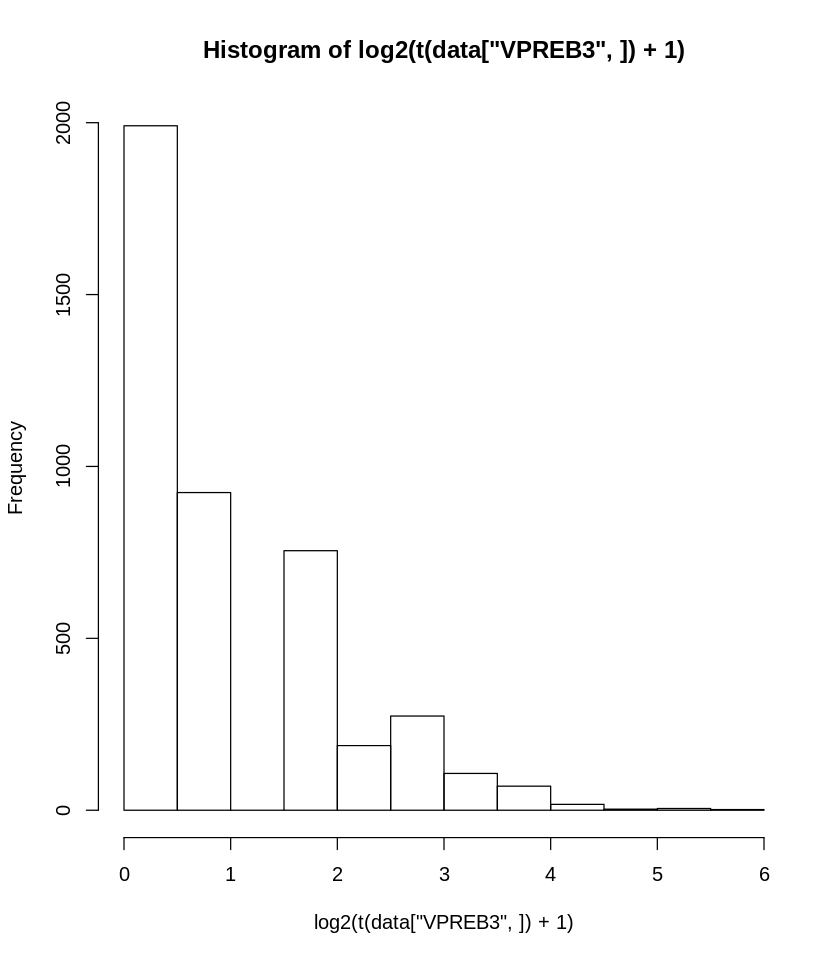

In [300]:
hist(log2(t(data['VPREB3',])+1))

# isotypeの抽出

In [230]:
raceid.isotype <- as.data.frame(as.matrix(subset@raw.data[,colnames(subset@data)]))
raceid.isotype <- subset(raceid.isotype, sapply(rownames(raceid.isotype),
                                               function(x){grepl('^IGH[AG][1234]|^IGH[DME]$', x)}))

In [246]:
isotypes <- rownames(raceid.isotype[apply(raceid.isotype, 2, which.max), ])
isotypes <- sub('[.].*', '', isotypes)
isotypes.df <- data.frame(cell = colnames(raceid.isotype), isotype = isotypes)
head(isotypes.df)

cell,isotype
AAACCTGAGGGTTTCT,IGHG3
AAACCTGCACACTGCG,IGHM
AAACCTGCAGCATACT,IGHG1
AAACCTGCAGTGAGTG,IGHG1
AAACCTGGTAGCTAAA,IGHG1
AAACCTGGTTGAACTC,IGHG3


In [245]:
head(isotypes)

[1] "IGHG3"   "IGHM"    "IGHG1"   "IGHG1.1" "IGHG1.2" "IGHG3.1"

# RaceID3によるrare cell typesの検出

In [4]:
source("../RaceID3_StemID2/RaceID3_StemID2_class.R")

In [86]:
raceid.in <- as.data.frame(as.matrix(subset@raw.data[,colnames(subset@data)]))

#remove immunoglobulin and mitochondrial genes
raceid.in <- subset(raceid.in, sapply(rownames(raceid.in),
                                               function(x){!grepl("^MT-",x)&!grepl("^IG",x)&!grepl("^RP",x)&!grepl("^JCHAIN",x)}))

In [87]:
raceid <- SCseq(raceid.in)

In [88]:
CGenes <- c("MALAT1","PCNA","MKI67")

In [89]:
raceid <- filterdata(raceid, mintotal = 200, minexpr = 1, minnumber = 1, maxexpr = Inf,
                    downsample = FALSE, sfn = FALSE, hkn = FALSE, dsn = 1,
                    rseed = 17000, CGenes = CGenes, FGenes = NULL, ccor = .4)

In [90]:
raceid <- clustexp(raceid, clustnr = 5, bootnr = 50, metric = "pearson", 
                   do.gap = FALSE, sat = TRUE, SE.method ="Tibs2001SEmax", 
                   SE.factor = .25, B.gap = 50, cln = 0, rseed = 17000,
                   FUNcluster = "kmedoids", FSelect = TRUE)

k = 1 
k = 2 
k = 3 
k = 4 
k = 5 
boot 1 
boot 2 
boot 3 
boot 4 
boot 5 
boot 6 
boot 7 
boot 8 
boot 9 
boot 10 
boot 11 
boot 12 
boot 13 
boot 14 
boot 15 
boot 16 
boot 17 
boot 18 
boot 19 
boot 20 
boot 21 
boot 22 
boot 23 
boot 24 
boot 25 
boot 26 
boot 27 
boot 28 
boot 29 
boot 30 
boot 31 
boot 32 
boot 33 
boot 34 
boot 35 
boot 36 
boot 37 
boot 38 
boot 39 
boot 40 
boot 41 
boot 42 
boot 43 
boot 44 
boot 45 
boot 46 
boot 47 
boot 48 
boot 49 
boot 50 


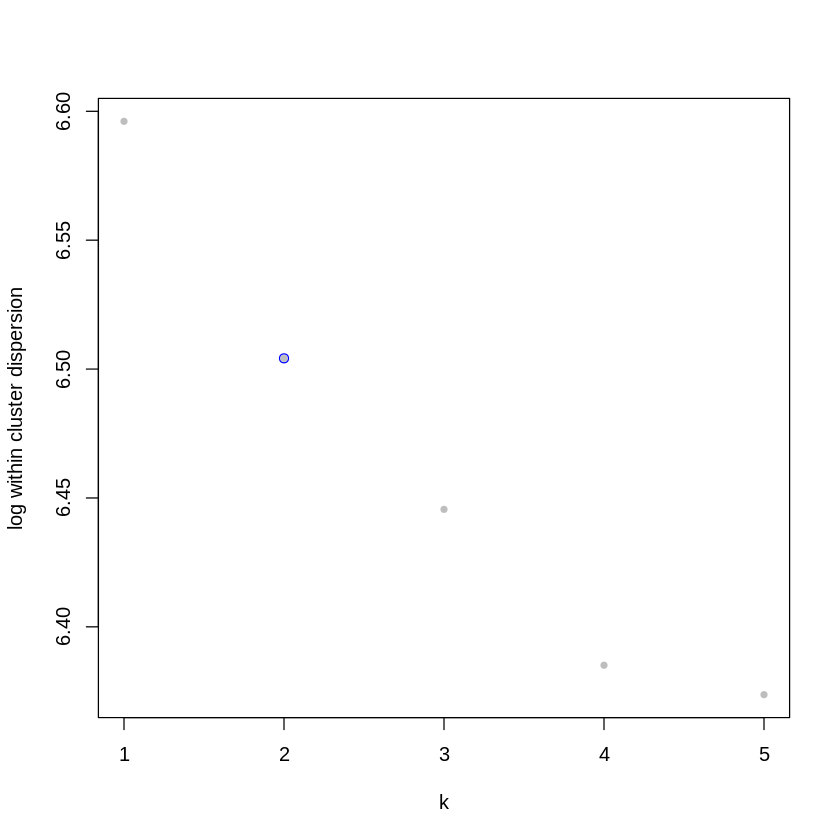

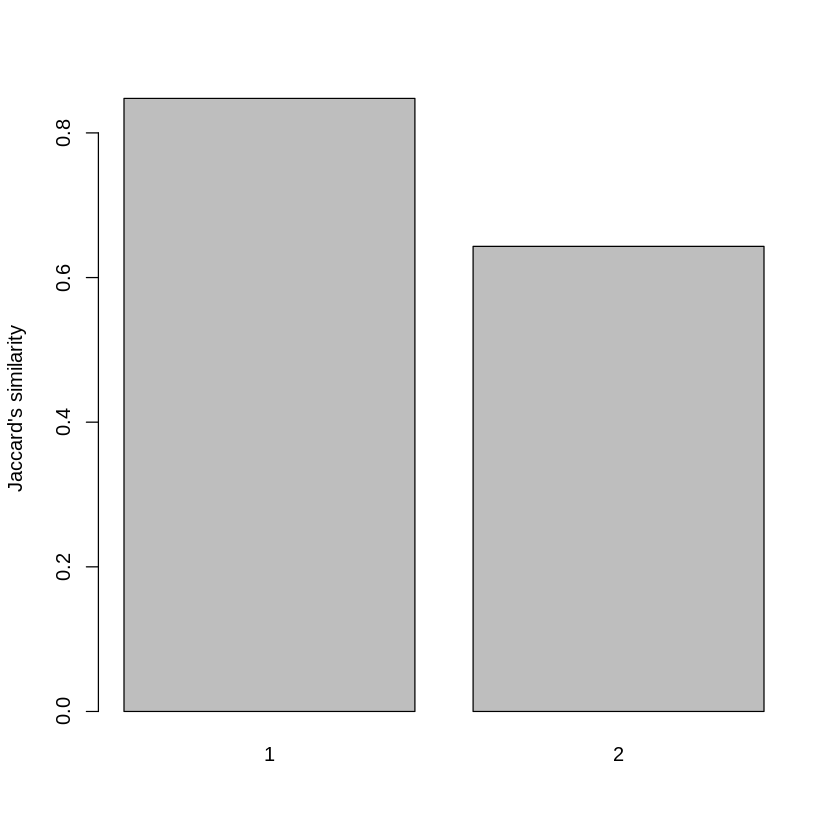

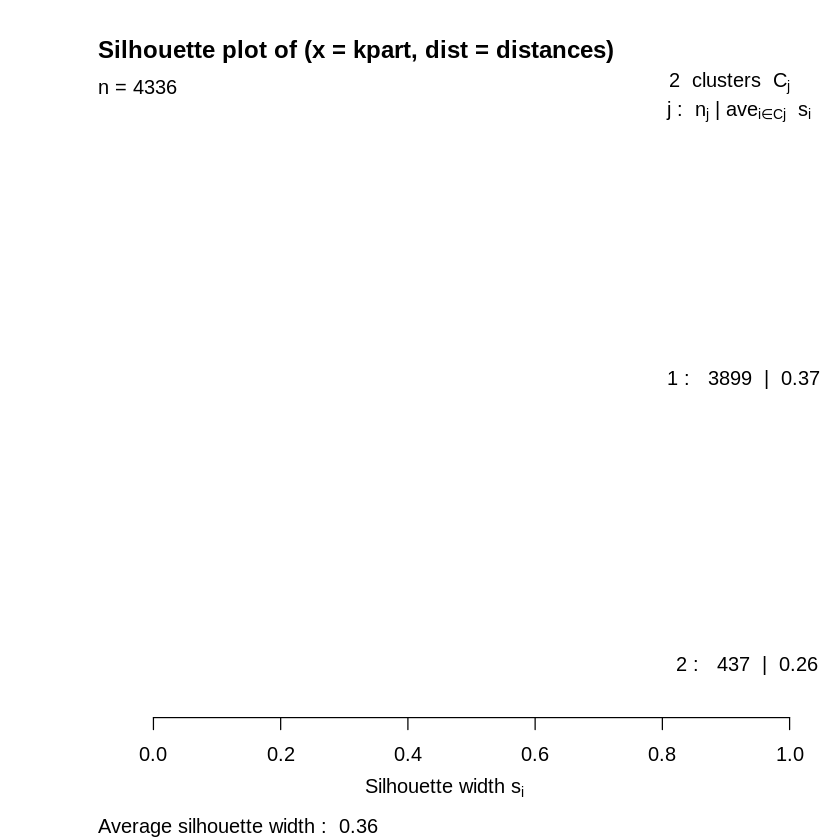

In [91]:
#cluster QC
plotsaturation(raceid, disp = TRUE)
#plotgap(raceid)
plotjaccard(raceid)
plotsilhouette(raceid)


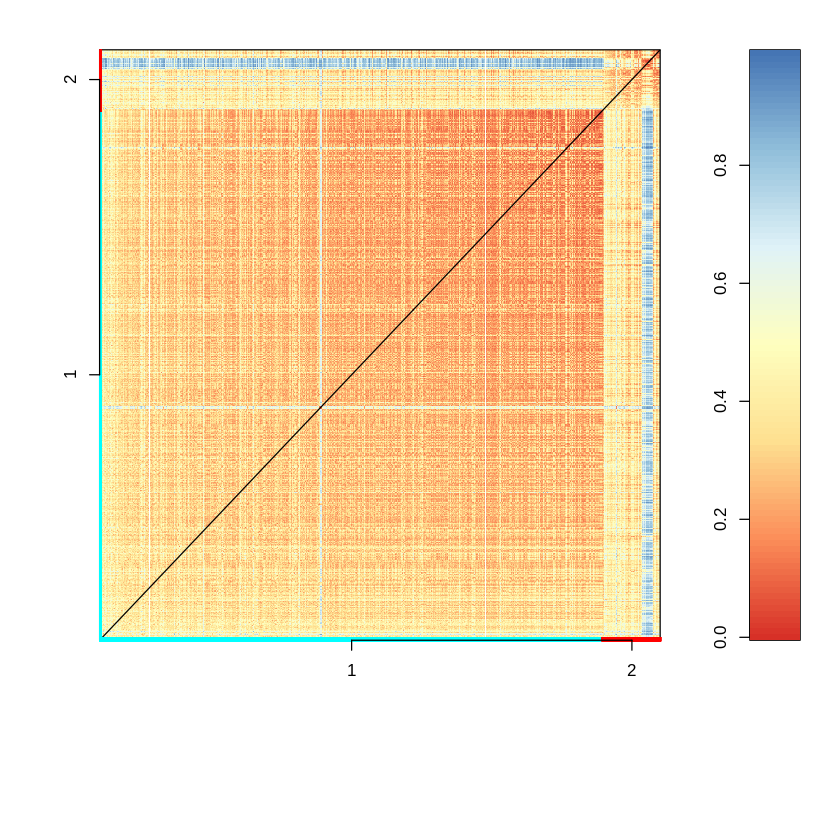

In [92]:
x <- clustheatmap(raceid, final = FALSE, hmethod = "single")

In [93]:
#outlier identification
raceid <- findoutliers(raceid, outminc = 2, outlg = 4)

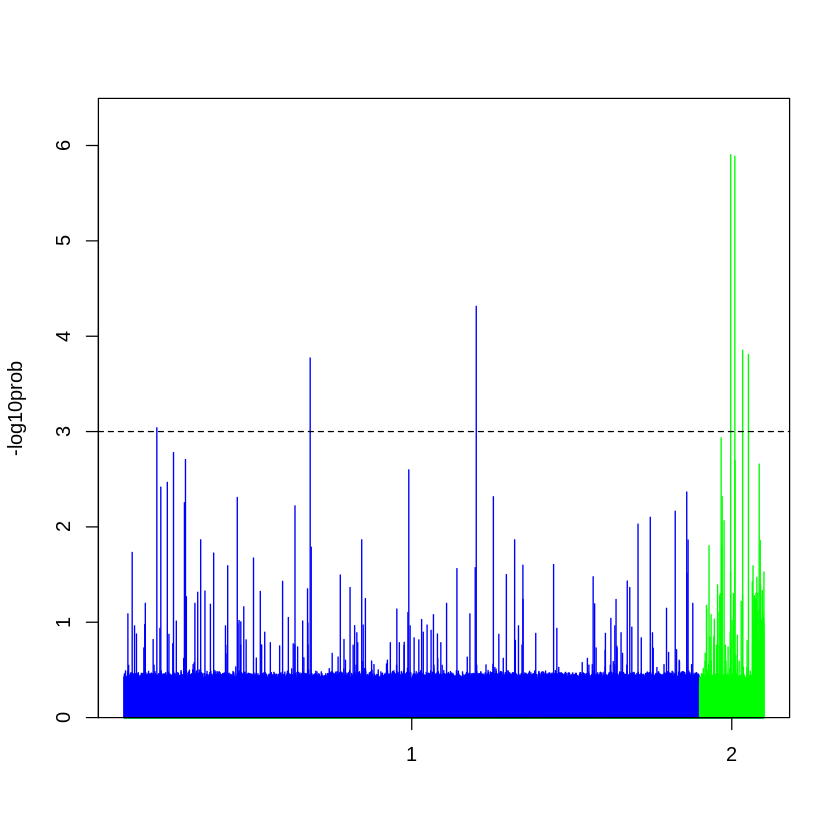

In [94]:
plotoutlierprobs(raceid)

In [95]:
x <- data.frame (CELLID = names(raceid@cpart), cluster = raceid@cpart)
write.table(x[order(x$cluster, decreasing = FALSE),], "cell_clust.xls", row.names = FALSE,
           col.names = TRUE, sep = "\t", quote = FALSE)

In [ ]:
# (optional) reclassification of cells based on random forests
raceid <- rfcorrect(raceid, rfseed = 12345, final = TRUE, nbfactors = 5)

In [ ]:
cdiff <- clustdiffgenes(raceid, pvalue = .01)

In [107]:
head(cdiff$cl.4, 20)

,mean.ncl,mean.cl,fc,pv,padj
MT2A,0.2448701,11.777685,48.09769,0.000547406,1
MT1X,0.1515436,6.362785,41.98650,0.009046303,1


In [168]:
head(cdiff$cl.5, 50)

,mean.ncl,mean.cl,fc,pv,padj
CD74,2.4376458,10.3653050,4.2521784,2.360428e-13,5.093803e-10
CD79A,1.3426716,6.5402818,4.8710955,5.317177e-11,5.737234e-08
HLA-DRB1,0.3341694,2.4381767,7.2962298,8.601390e-06,6.187267e-03
HLA-DRA,0.5632096,2.8085138,4.9866227,1.580051e-05,8.524373e-03
VPREB3,0.3370784,1.9728584,5.8528171,8.183297e-05,3.531911e-02
CLEC2D,0.1336077,0.4186325,3.1332974,3.008759e-04,1.082150e-01
HLA-DMA,0.3094155,0.7148138,2.3102071,3.656535e-04,1.097160e-01
RGS1,1.0554929,3.0395478,2.8797426,4.253871e-04,1.097160e-01
LAPTM5,0.1966056,0.5344570,2.7184220,4.575739e-04,1.097160e-01
HCST,0.1482267,0.4175570,2.8170160,7.706812e-04,1.663130e-01


In [117]:
d <- diffgenes(raceid, cl1 = 6, cl2 = c(1,2,3,4,5), mincount = 1)

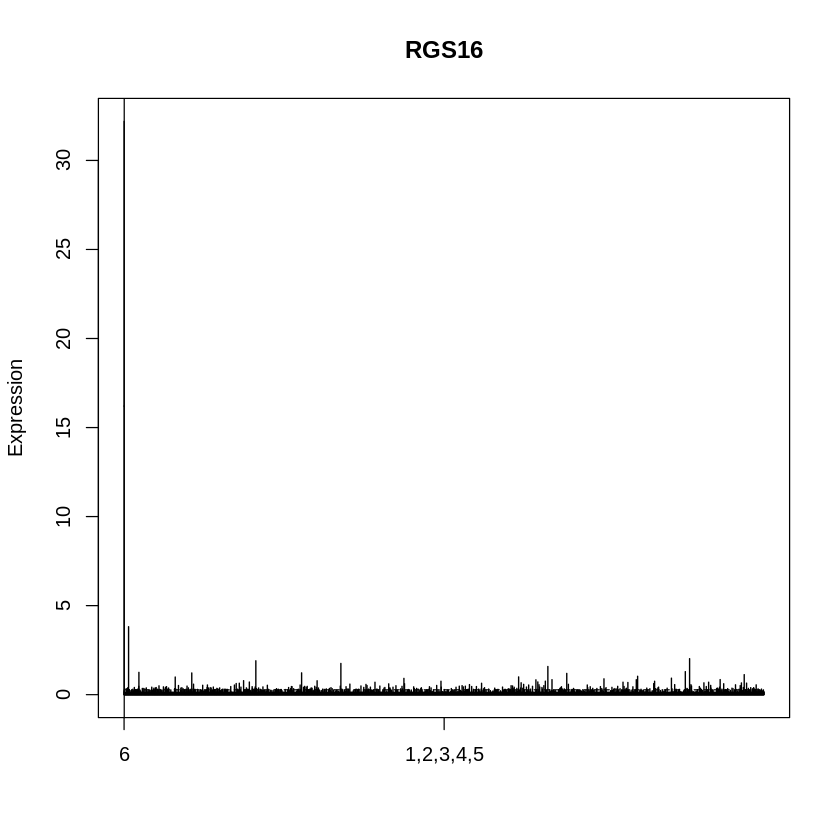

In [118]:
plotdiffgenes(d, gene = "RGS16")

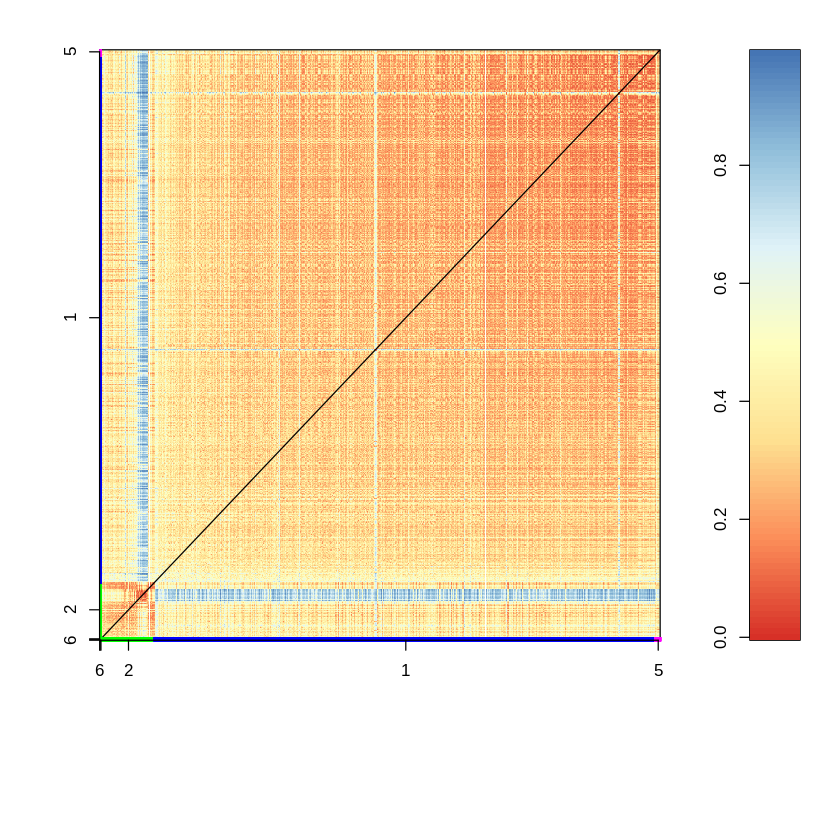

In [119]:
x <- clustheatmap(raceid, final = TRUE, hmethod = "single")

In [ ]:
raceid <- comptsne(raceid, rseed = 1555, sammonmap = FALSE, initial_cmd = TRUE)

sigma summary: Min. : 0.0621325256028065 |1st Qu. : 0.0850769389930034 |Median : 0.0950480142034899 |Mean : 0.101477900911488 |3rd Qu. : 0.111195937453527 |Max. : 0.268911123590811 |


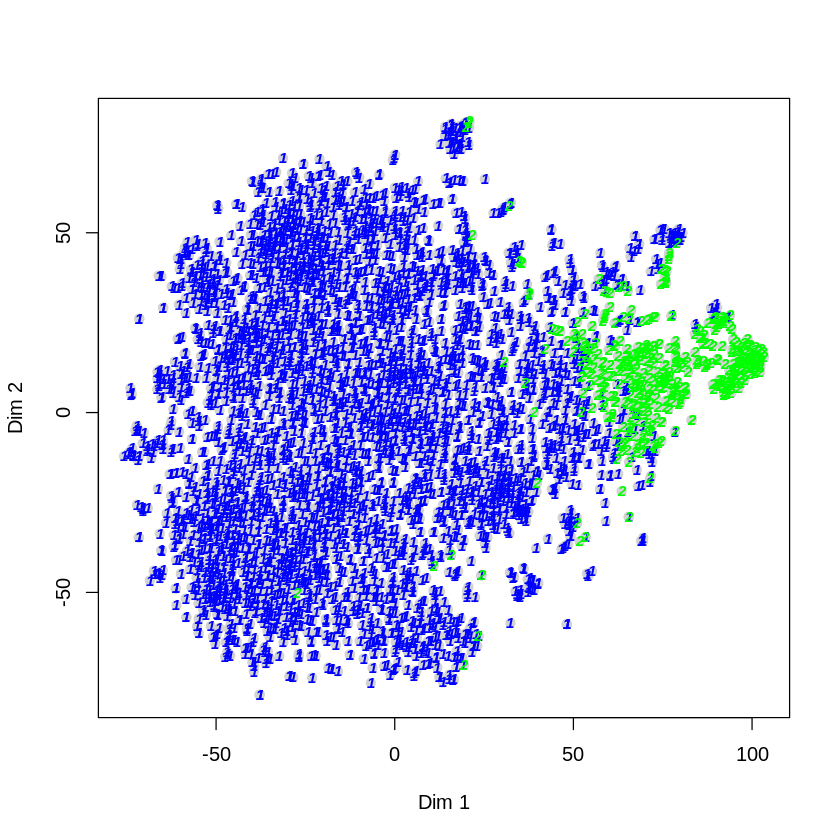

In [124]:
plottsne(raceid, final = FALSE)

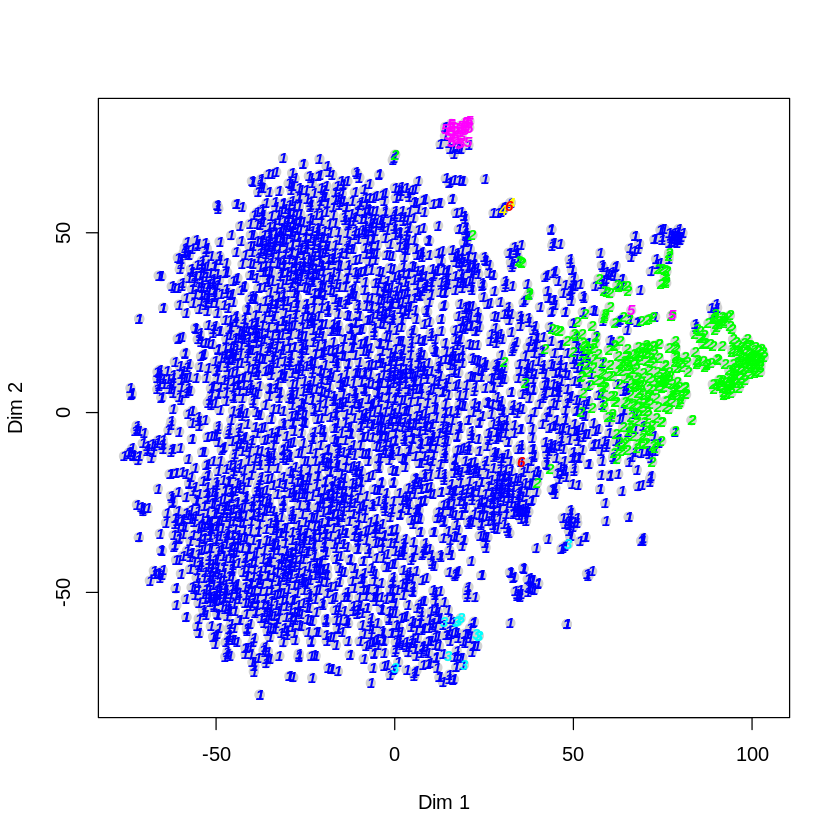

In [125]:
plottsne(raceid, final = TRUE)

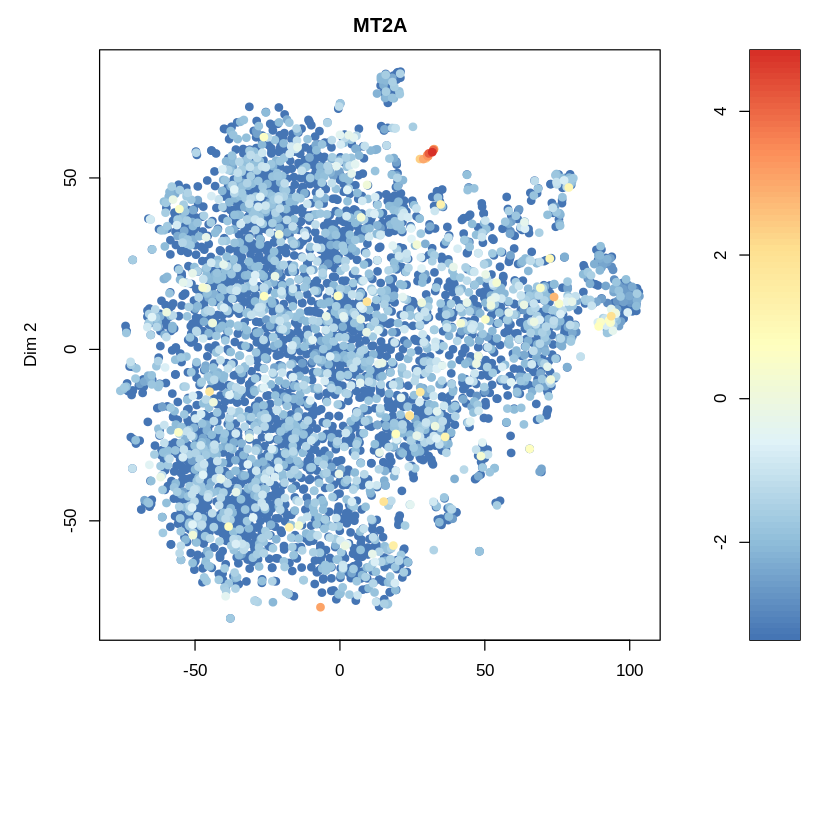

In [129]:
g <- c("MT2A")
plotexptsne(raceid, g, n = "MT2A", logsc = TRUE)

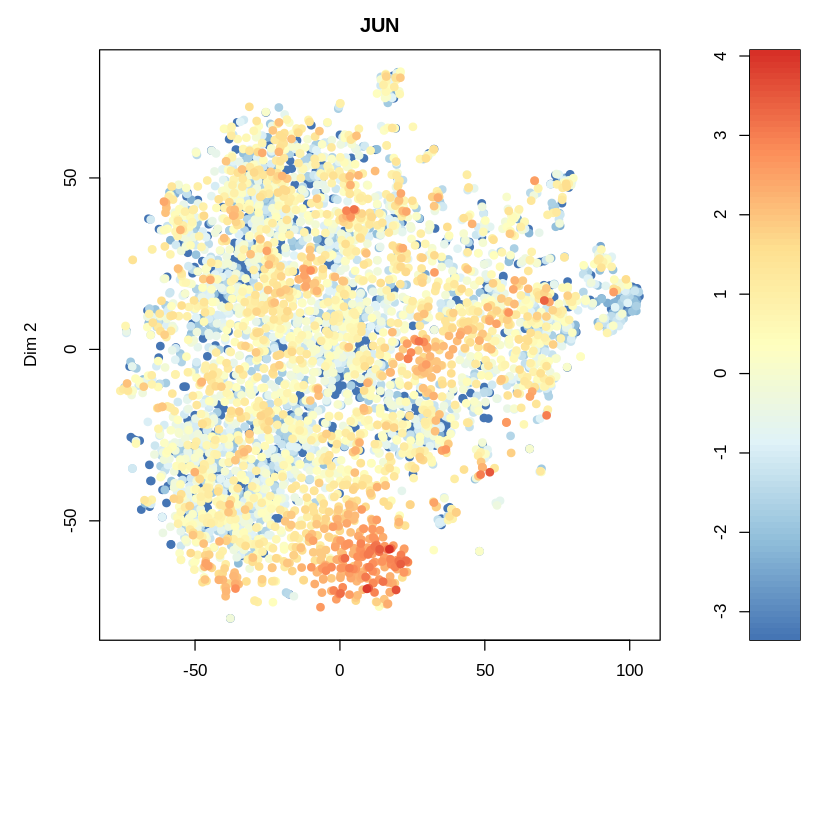

In [130]:
g <- c("JUN")
plotexptsne(raceid, g, n = "JUN", logsc = TRUE)

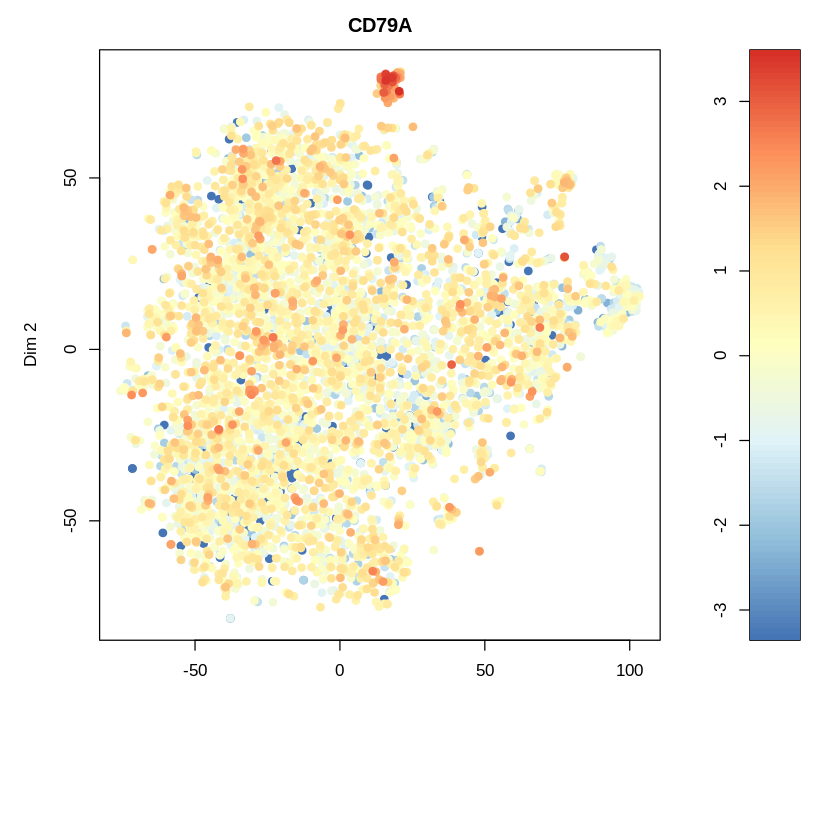

In [132]:
g <- c("CD79A")
plotexptsne(raceid, g, n = "CD79A", logsc = TRUE)

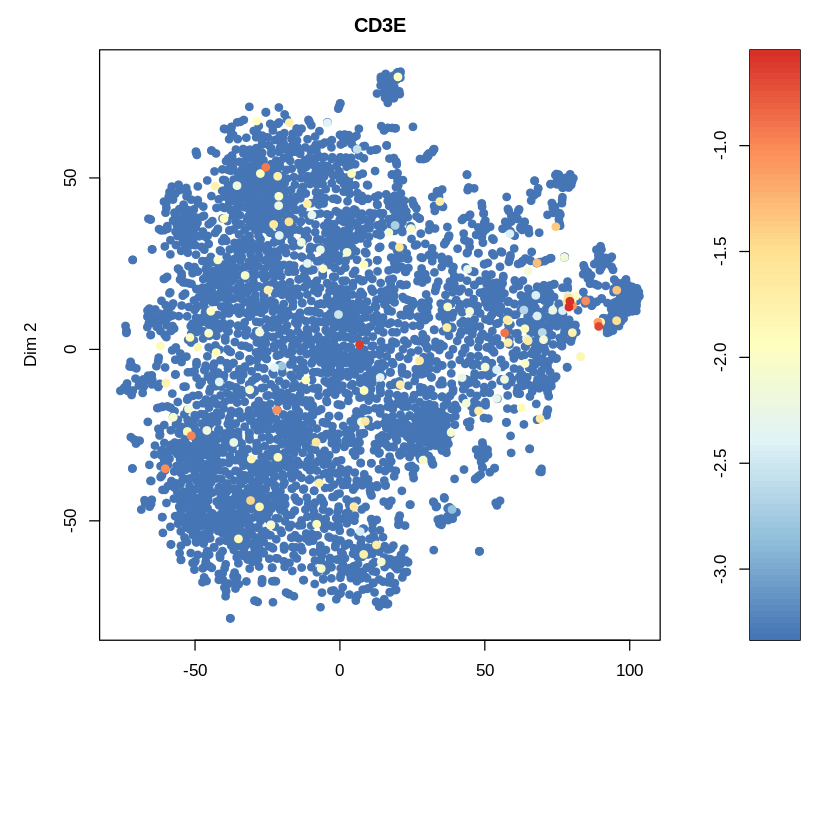

In [158]:
g = "CD3E"
plotexptsne(raceid, g, n = g, logsc = TRUE)

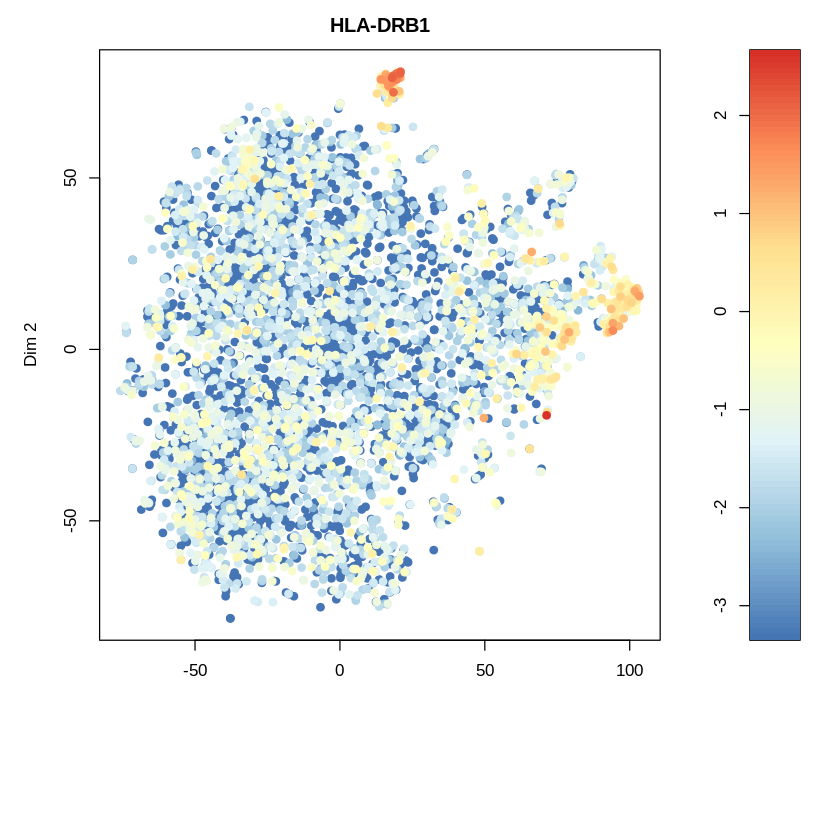

In [162]:
g = "HLA-DRB1"
plotexptsne(raceid, g, n = g, logsc = TRUE)

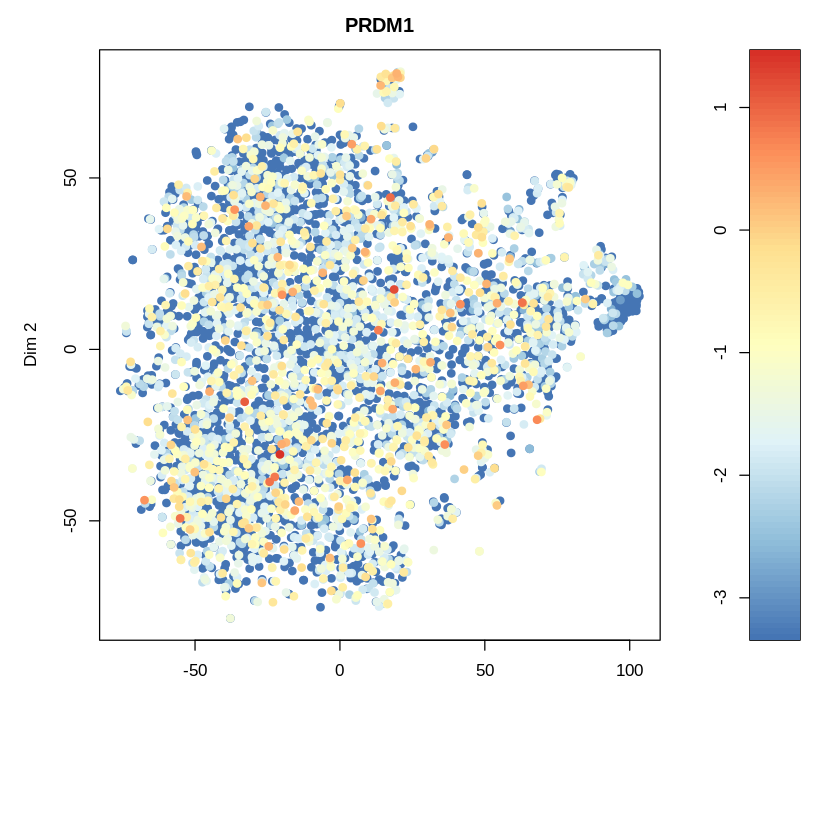

In [165]:
g = "PRDM1"
plotexptsne(raceid, g, n = g, logsc = TRUE)

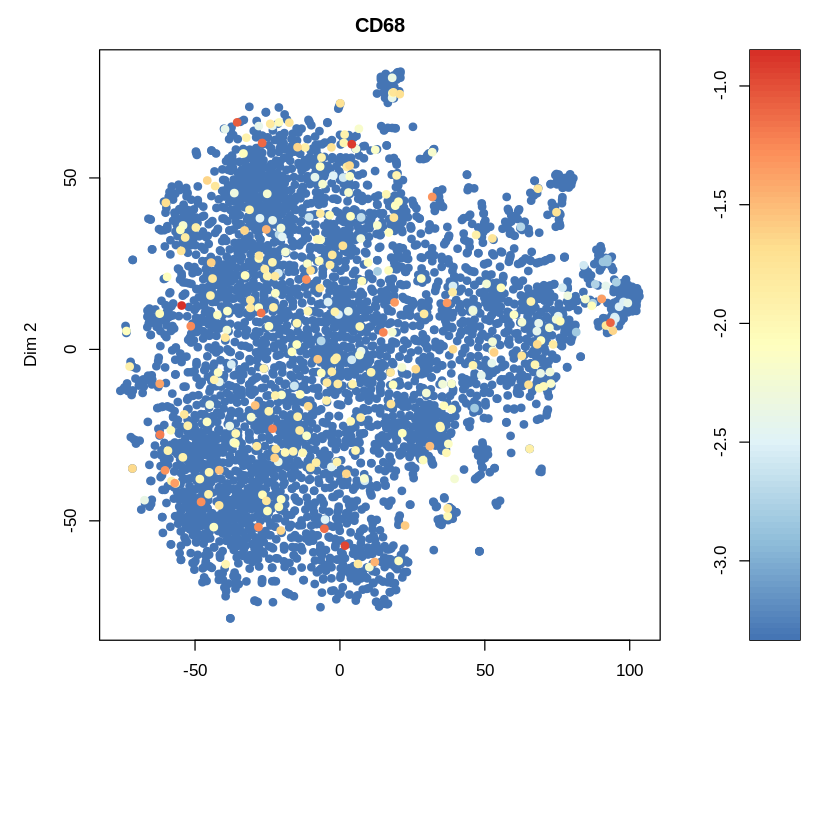

In [167]:
g = "CD68"
plotexptsne(raceid, g, n = g, logsc = TRUE)

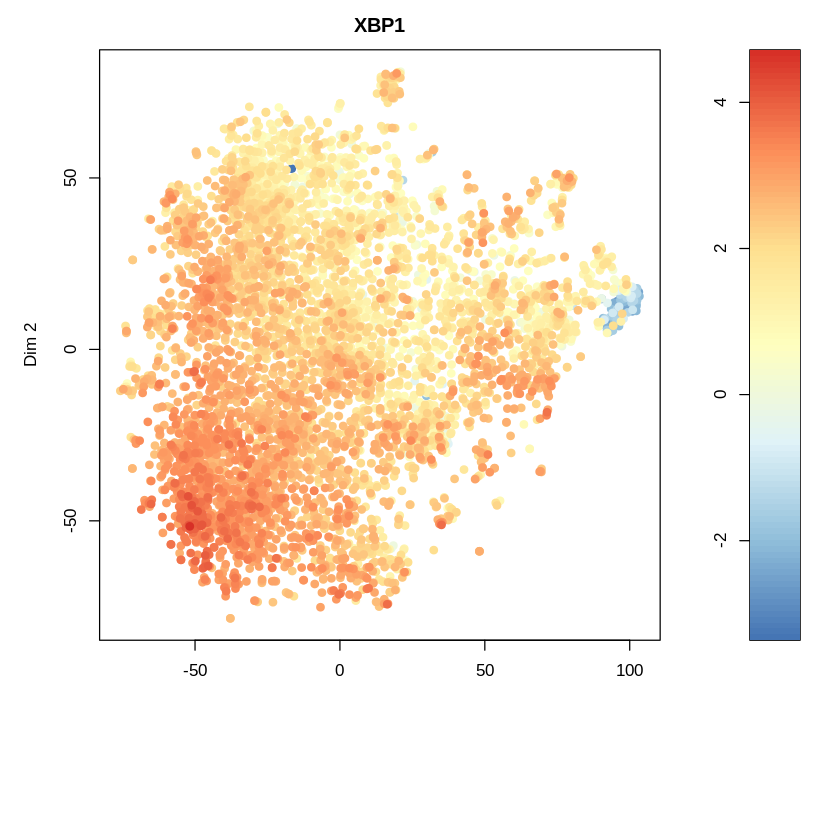

In [171]:
g = "XBP1"
plotexptsne(raceid, g, n = g, logsc = TRUE)

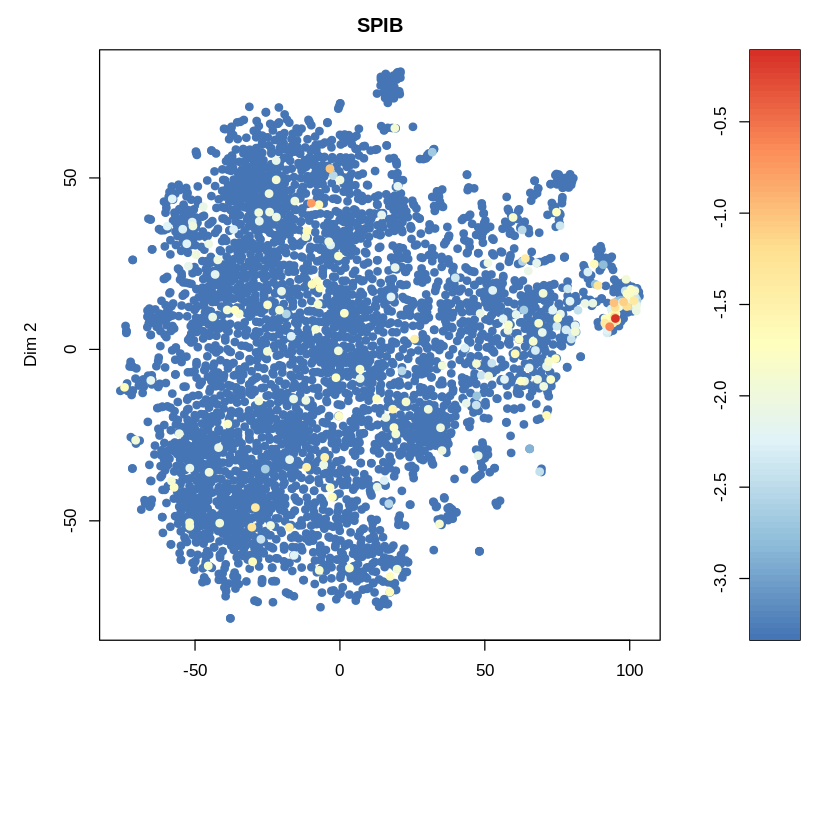

In [172]:
g = "SPIB"
plotexptsne(raceid, g, n = g, logsc = TRUE)

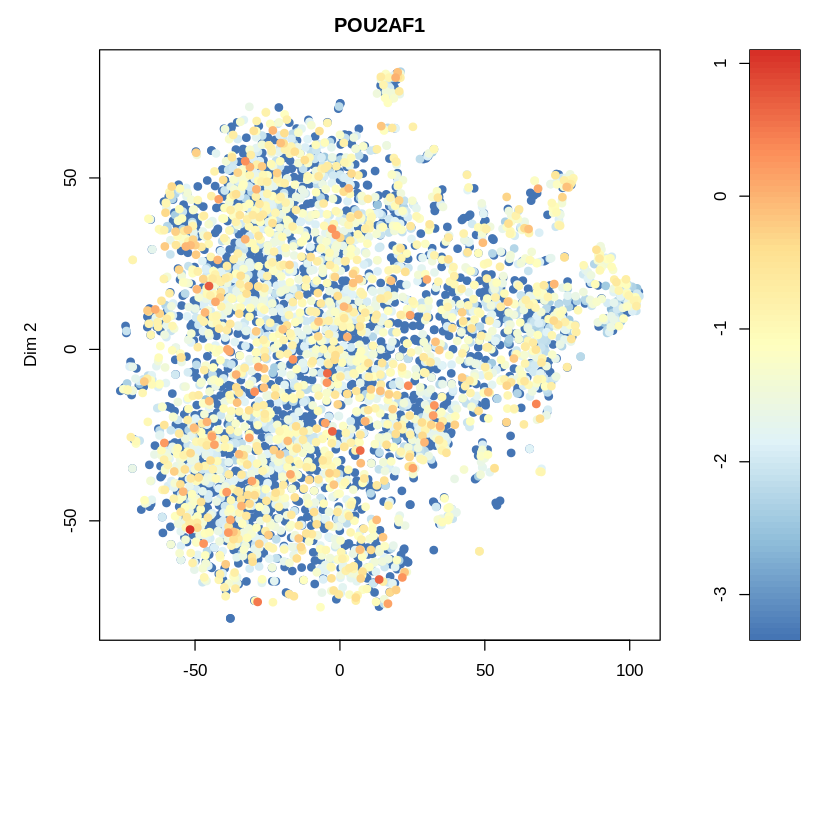

In [174]:
g = "POU2AF1"
plotexptsne(raceid, g, n = g, logsc = TRUE)

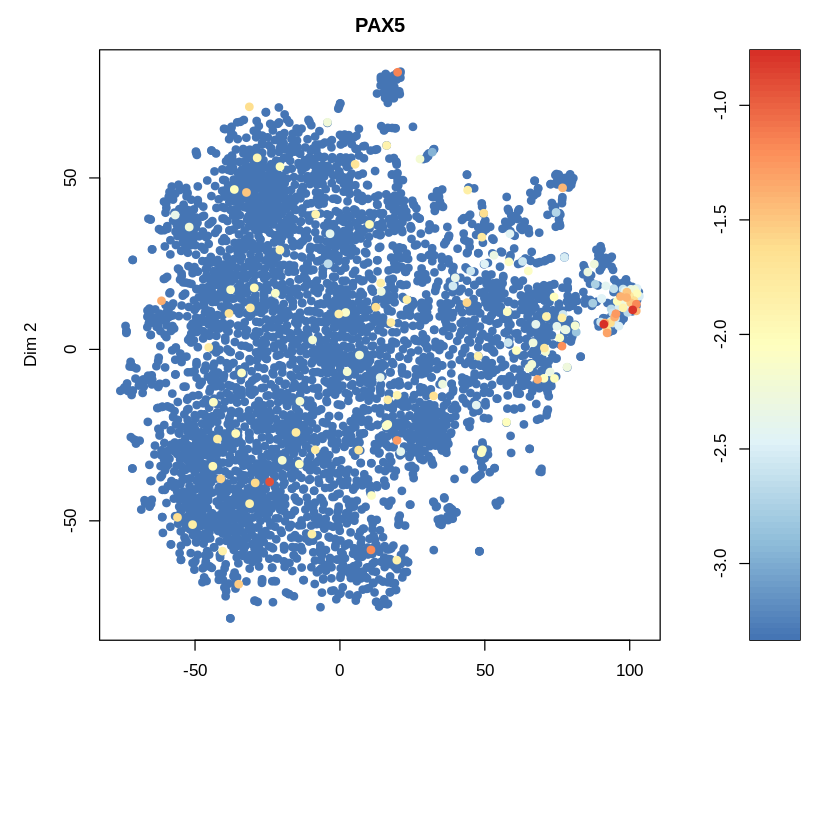

In [175]:
g = "PAX5"
plotexptsne(raceid, g, n = g, logsc = TRUE)

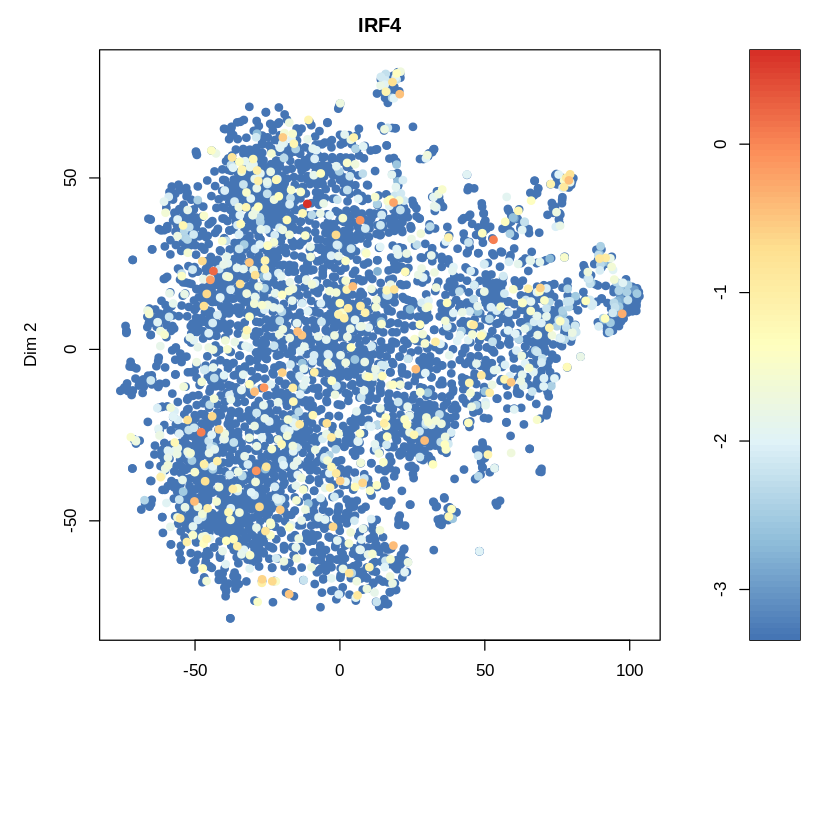

In [176]:
g = "IRF4"
plotexptsne(raceid, g, n = g, logsc = TRUE)

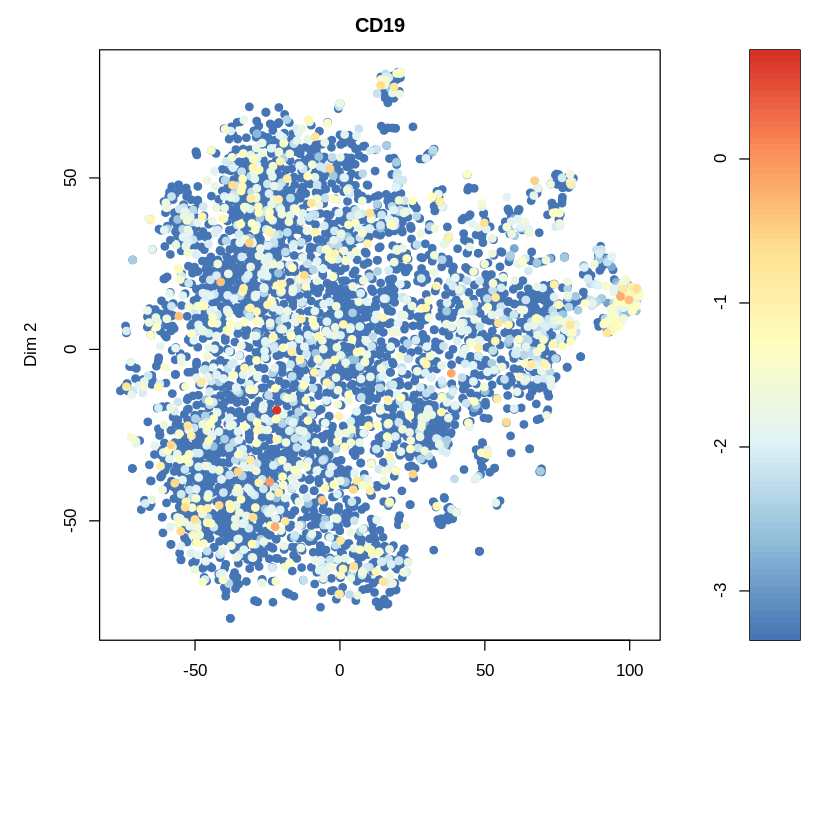

In [177]:
g = "CD19"
plotexptsne(raceid, g, n = g, logsc = TRUE)

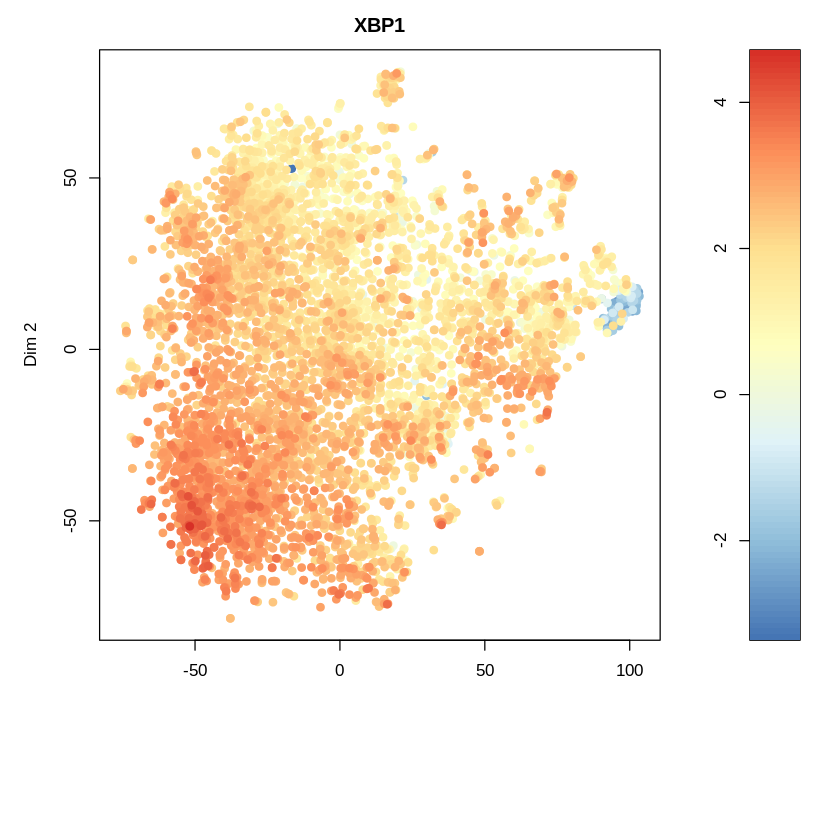

In [178]:
g = "XBP1"
plotexptsne(raceid, g, n = g, logsc = TRUE)

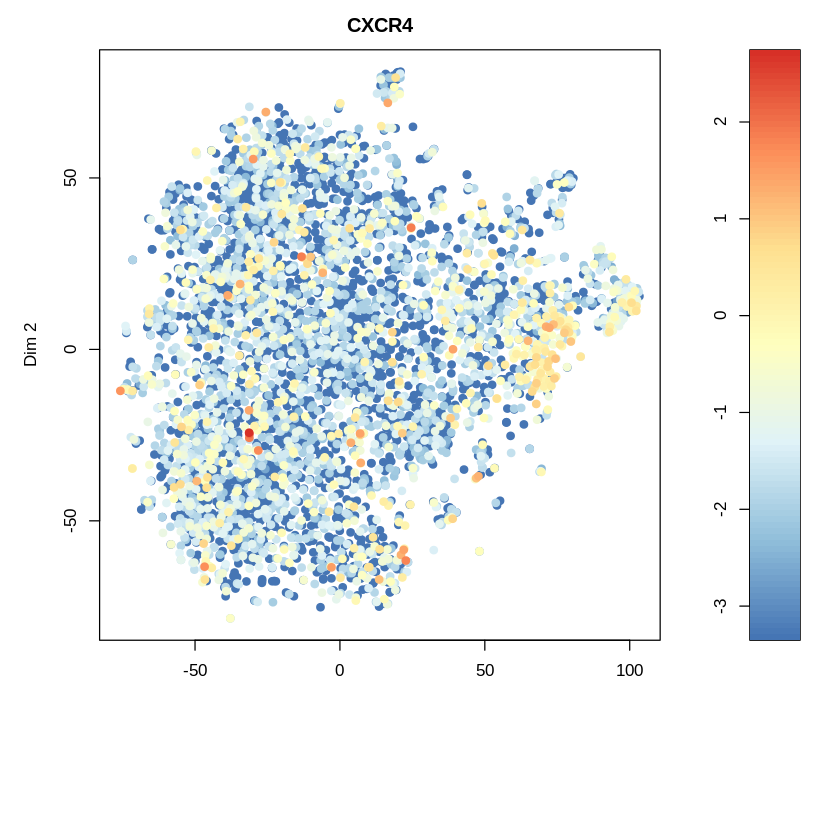

In [190]:
g = "CXCR4"
plotexptsne(raceid, g, n = g, logsc = TRUE)

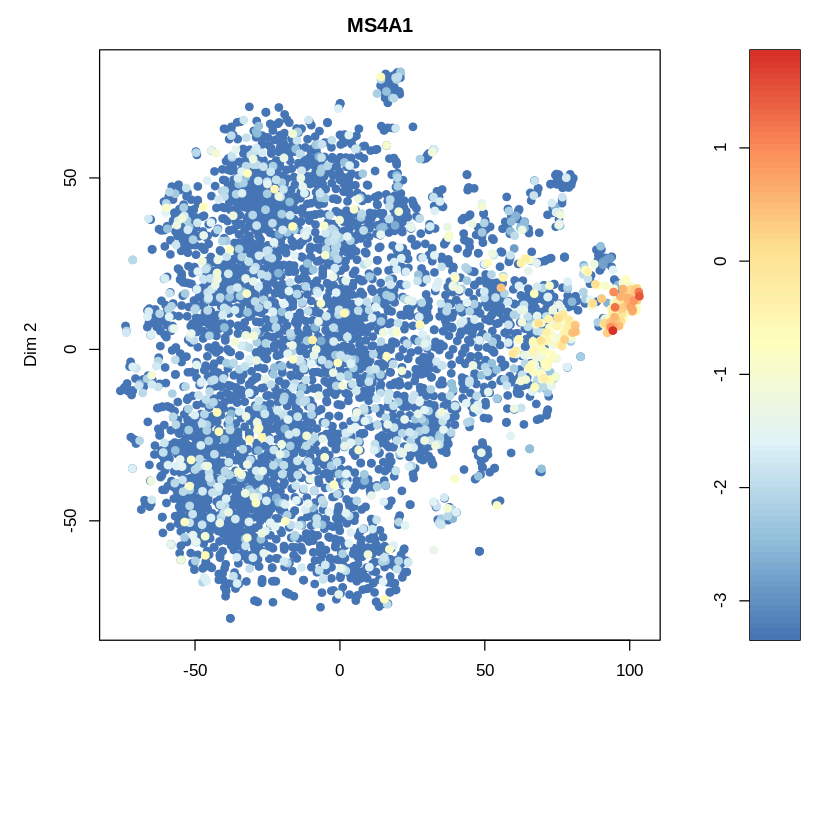

In [135]:
g <- c("MS4A1")
plotexptsne(raceid, g, n = "MS4A1", logsc = TRUE)

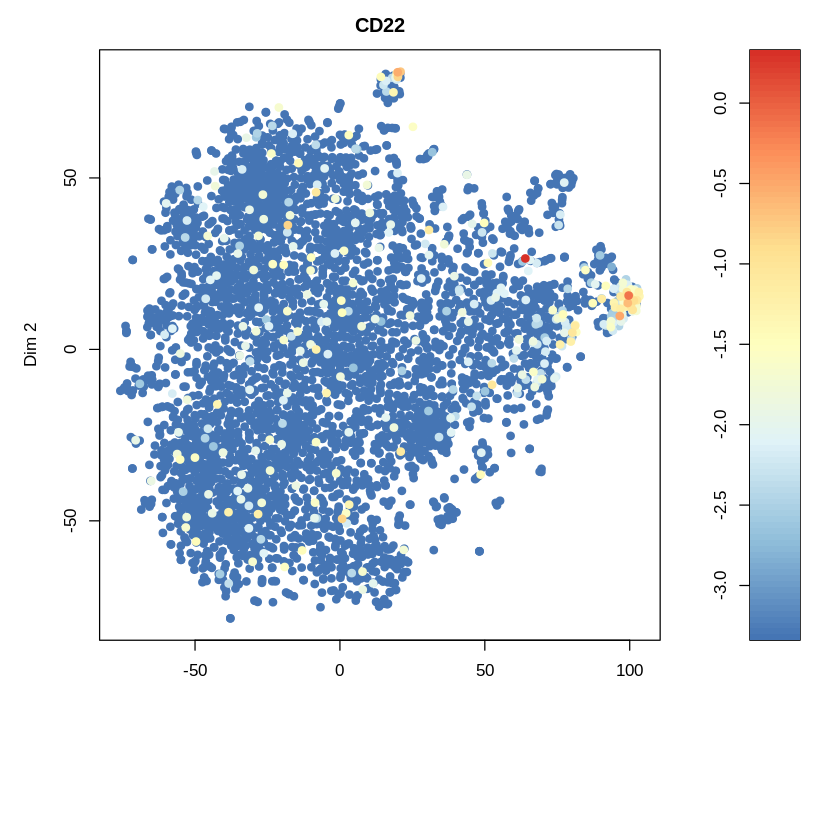

In [191]:
g = "CD22"
plotexptsne(raceid, g, n = g, logsc = TRUE)

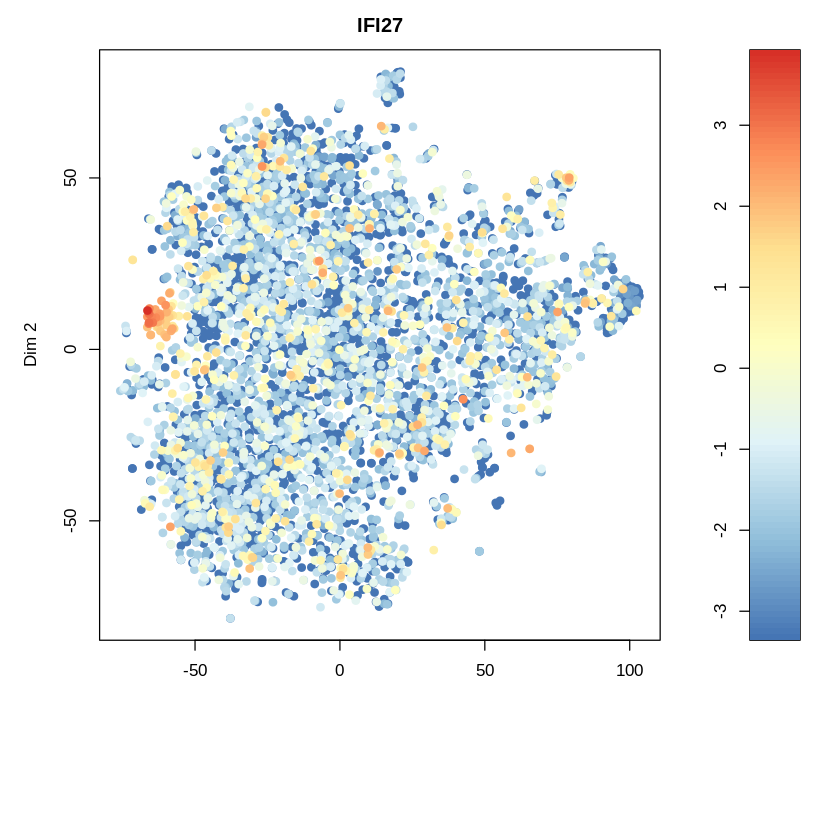

In [199]:
g = "IFI27"
plotexptsne(raceid, g, n = g, logsc = TRUE)

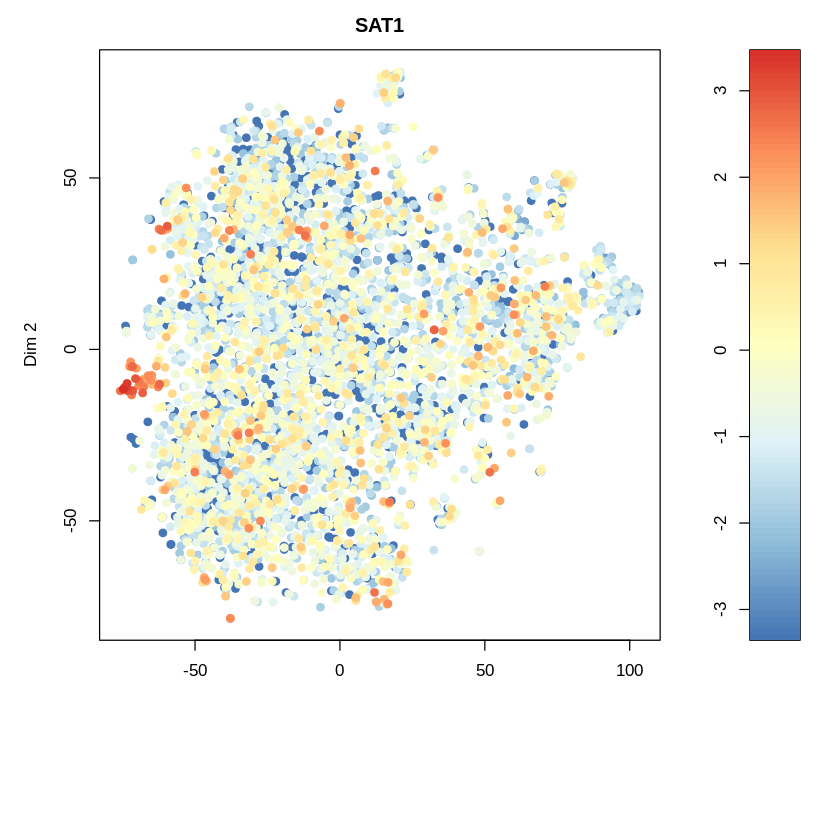

In [201]:
g = "SAT1"
plotexptsne(raceid, g, n = g, logsc = TRUE)

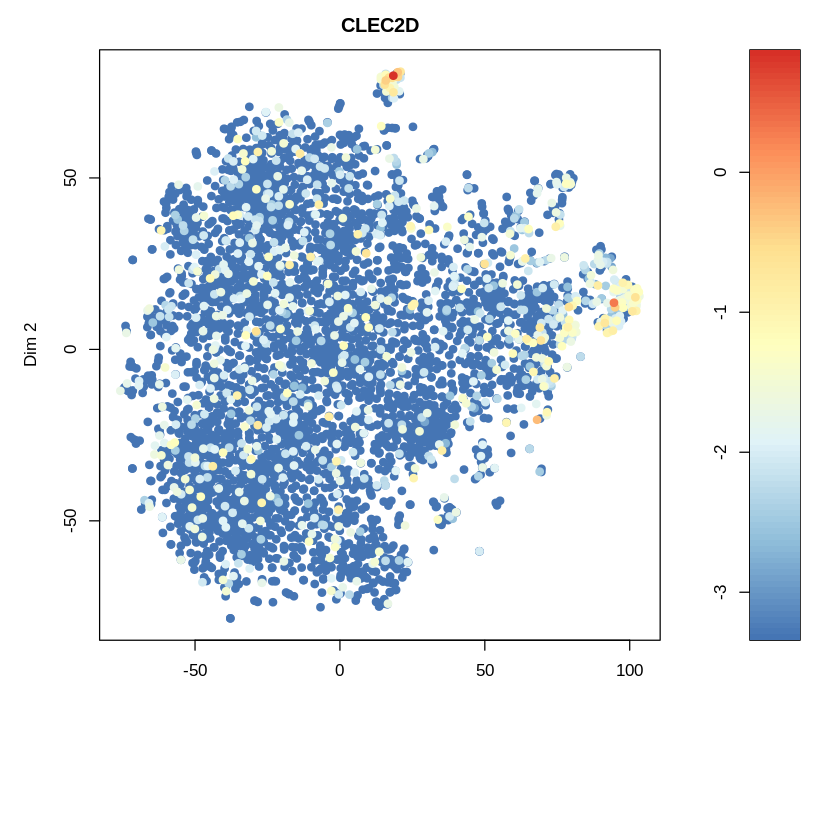

In [205]:
g = "CLEC2D"
plotexptsne(raceid, g, n = g, logsc = TRUE)

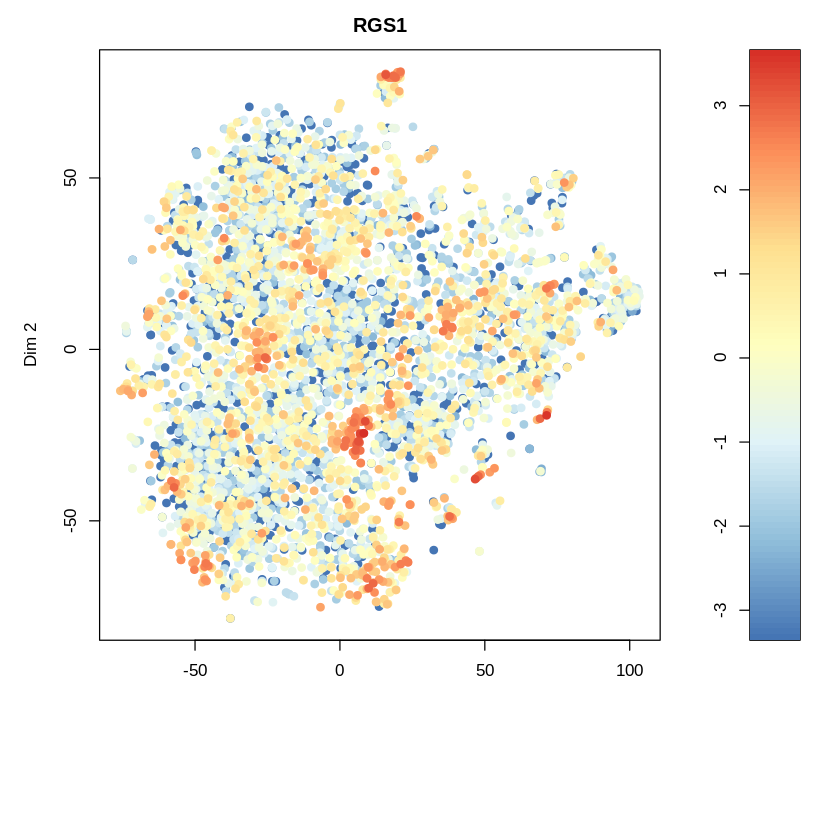

In [206]:
g = "RGS1"
plotexptsne(raceid, g, n = g, logsc = TRUE)

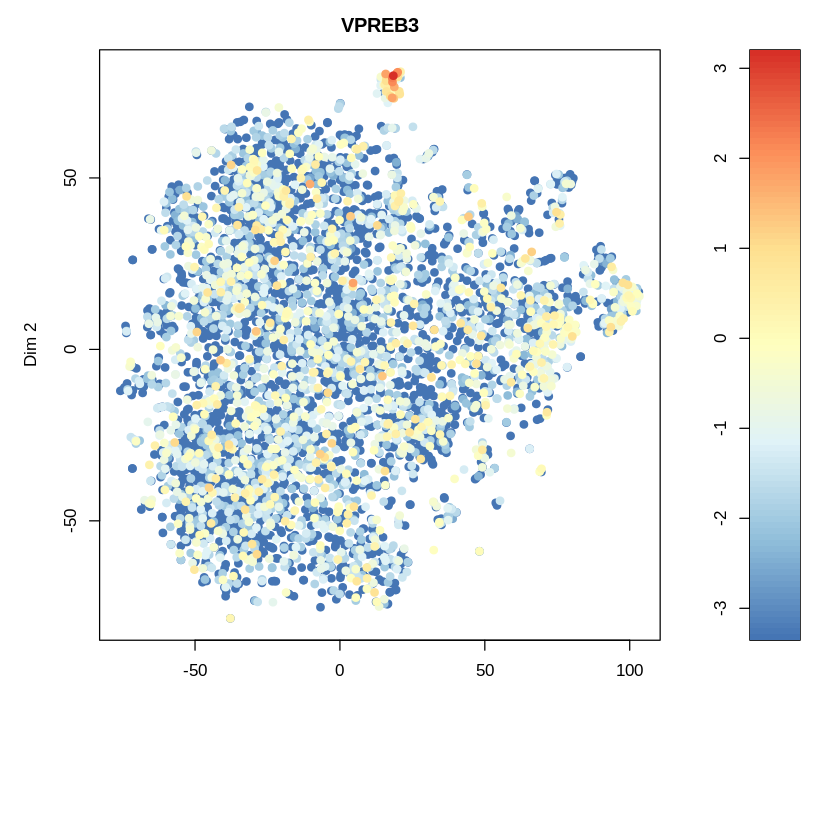

In [208]:
g = "VPREB3"
plotexptsne(raceid, g, n = g, logsc = TRUE)

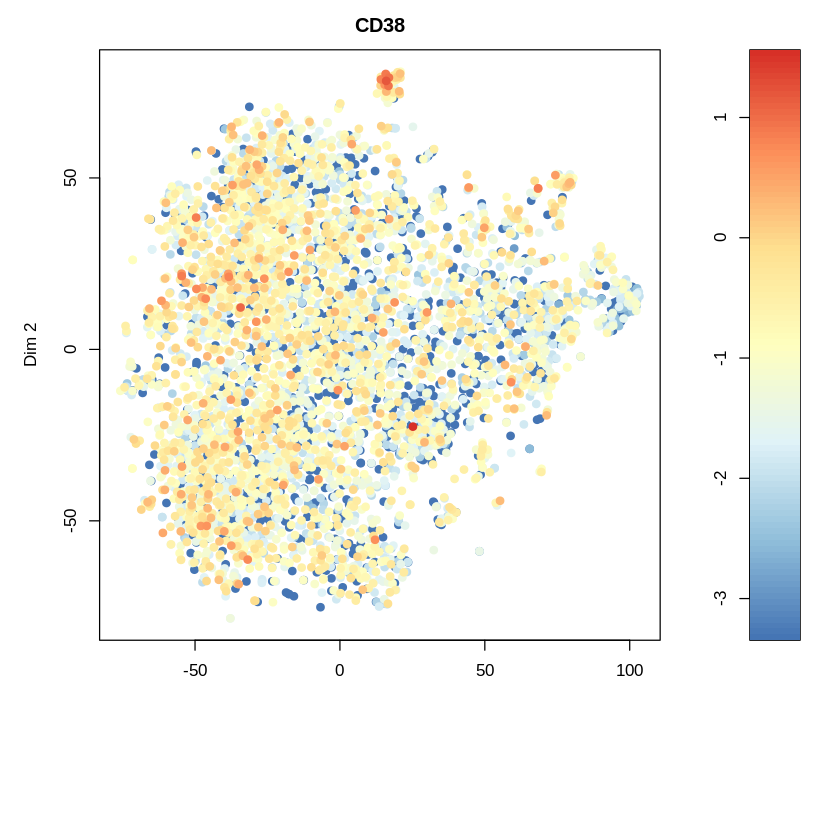

In [209]:
g = "CD38"
plotexptsne(raceid, g, n = g, logsc = TRUE)

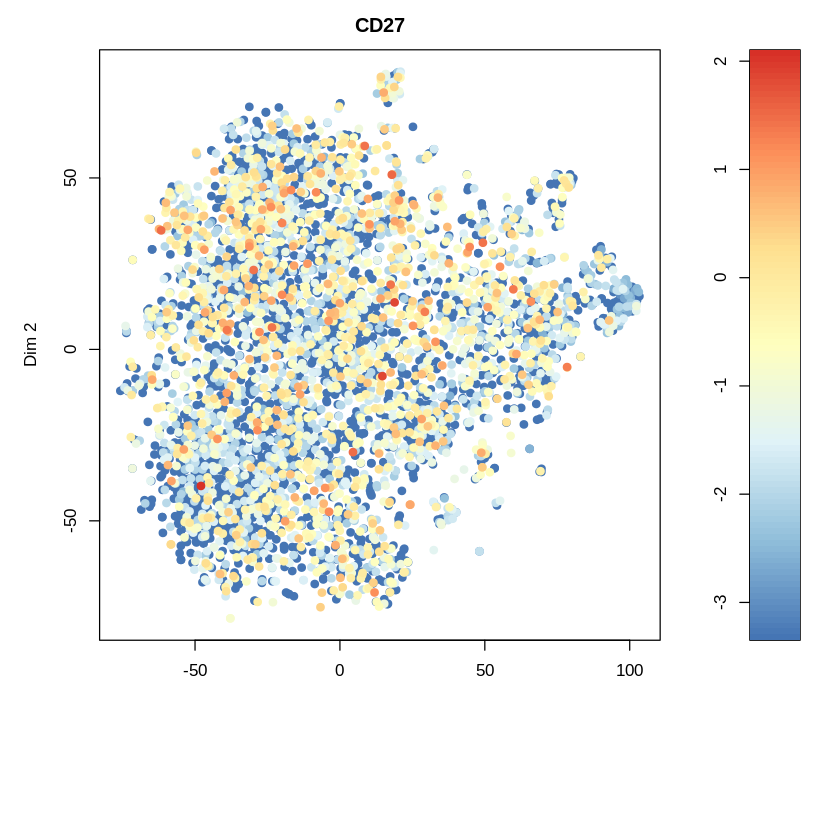

In [212]:
g = "CD27"
plotexptsne(raceid, g, n = g, logsc = TRUE)

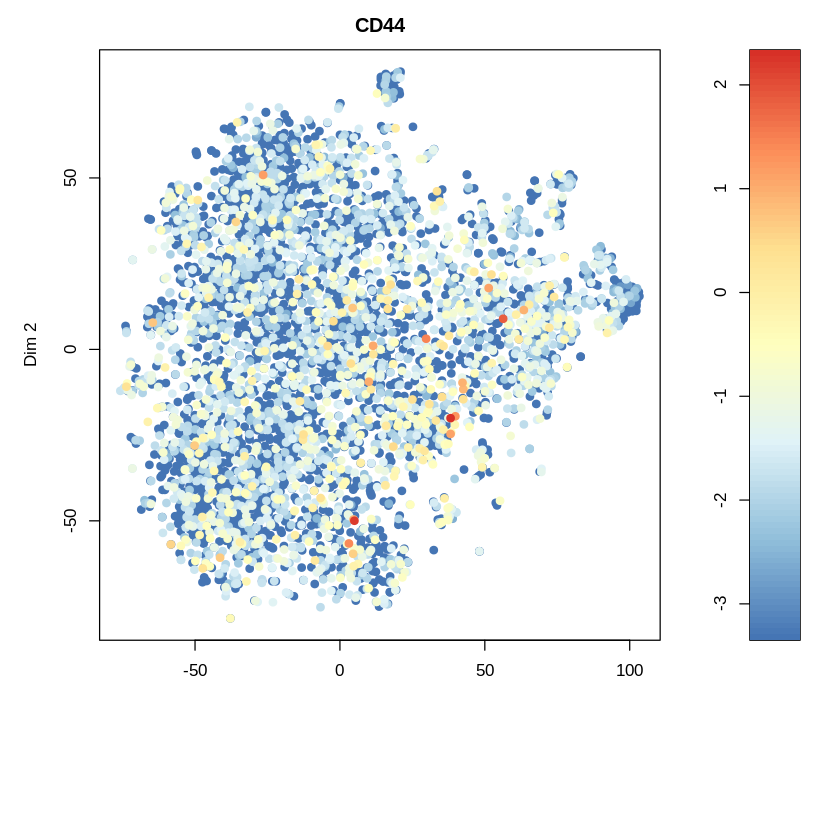

In [213]:
g = "CD44"
plotexptsne(raceid, g, n = g, logsc = TRUE)

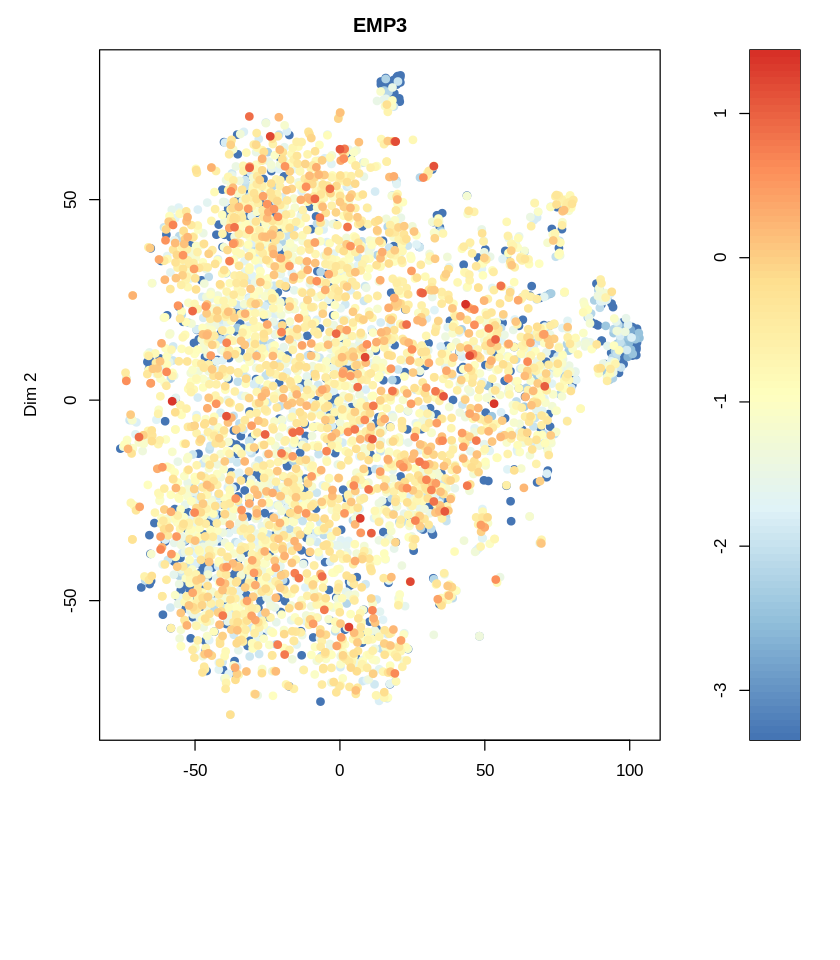

In [279]:
g = "EMP3"
plotexptsne(raceid, g, n = g, logsc = TRUE)

# isotypeの統合

In [255]:
# ravceidの出現順に並び替え
isotype_ordered <- isotypes.df[names(raceid@cluster$kpart),'isotype']

In [257]:
#cluster IDをisotypeに強制的に書き換える
raceid@cluster$kpart = as.numeric(as.factor(isotype_ordered))

In [259]:
levels(as.factor(isotype_ordered))

[1] "IGHA1" "IGHA2" "IGHD"  "IGHG1" "IGHG2" "IGHG3" "IGHG4" "IGHM"

In [268]:
#options(repr.plot.height = 8)
png("./isotype_tsne.png", height=4000, width=4000, res=300)
plottsne(raceid, final = FALSE)
dev.off()

png 
  2

In [270]:
length(isotype_ordered)

[1] 4336